##  Chapter 13: Multi-layer perceptrons 

# 13.4 Combating non-convexity with regularization

In [26]:
# This code cell will not be shown in the HTML version of this notebook
# imports from custom library

import sys
sys.path.append('../../')
import autograd.numpy as np
from mlrefined_libraries import *
%matplotlib notebook

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The compositional structure of neural networks makes their associated cost functions non-convex. This means that one can no longer randomly initialize gradient descent (or any of its variants) and be sure the algorithm eventually finds the global minimum, as is the case with convex functions. This mere theoretical inconvenience does not preclude the use of non-convex cost functions, but motivates a variety of engineering fixes to the cost function, the optimizing algorithm, or both, which in practice allows us to use non-convex costs effectively in machine learning and deep learning.

As illustrated in Figure 1 non-convexity manifests itself in a variety of ways, some of which are more problematic than the others. Starting from left the first panel shows the kind of non-convex region that is completely benign as it poses no hindrance to gradient-based algorithms. The second panel on the other hand shows worst nightmare for local optimization methods in general, and gradient-based methods in particular: existence of multiple local minima. These methods by nature cannot avoid local minima and halt at such points by design. The good news is that several analyses of neural network cost functions have shown - at least empirically - that their local minima are usually of high quality [????], meaning that they return an objective value close to that of the global minimum. The last two panels panels in Figure 1 show two other problematic areas that may be present in a non-convex function: a saddle point (third panel) and a flat (or nearly-flat) region (fourth panel).

<figure>
<img src= '../../mlrefined_images/tricks/nonconvexities.png' width="100%" height="auto"/>
<figcaption> <strong>Figure 1:</strong> <em> </em>
</figcaption>
</figure>

In this section we introduce regularization and show through several examples how it sometimes helps ameliorate these two issues. Regularization is a greatly useful notion that arises in various other contexts in machine learning including overfitting prevention, feature selection, soft-margin support vector machines, and probabilistic interpretation of machine learning models in a Bayesian framework. 



investigate how addition of a regularizer to the cost function helps ameliorate non-convexity. A regularizer is a simple convex function that is often added to such a cost function, slightly convexifying it and thereby helping numerical optimization techniques avoid poor solutions in its flat areas. One of the most common regularizers used in practice is the squared l2 norm
2  N 2
of the weights ∥w∥2 = wn, referred to as the l2 regularizer. To regularize a cost
n=1
function g (b, w) with this regularizer we simply add it to g giving the regularized cost
function

g (b, w) + λ ∥w∥2 .

Here λ ≥ 0 is a parameter (set by the user in practice) that controls the strength of each term, the original cost function and the regularizer, in the final sum. For example, if λ = 0 we have our original cost. On the other hand, if λ is set very large then the regularizer drowns out the cost and we have g (b, w) + λ ∥w∥2 ≈ λ ∥w∥2 . Typically in practice λ is set fairly small (e.g., λ = 0.1 or smaller).

In Fig. 3.12 we show two simple examples of non-convex cost functions which ex- emplify how the l2 regularizer can help numerical techniques avoid many (but not all) poor solutions in practice.

The first non-convex cost function,10 shown in the top left panel of Fig. 3.12, is de- fined over a symmetric interval about the origin and has three large flat areas containing undesirable stationary points. This kind of non-convex function is highly problematic because if an algorithm like gradient descent or Newton’s method is initialized at any point lying in these flat regions it will immediately halt. In the top right panel we show an l2 regularized version of the same cost. Note how regularization slightly convex- ifies the entire cost function, and in particular how it forces the flat regions to curve upwards. Now if e.g., gradient descent is initialized in either of the two flat regions on the left or right sides it will in fact travel downwards and reach a minimum. Note that both minima have slightly changed position from the original cost, but as long as λ is set relatively small this small change does not typically make a difference in practice. Note in this instance, however, that regularization has not helped with the 
problem of gradient descent halting at a poor solution if initialized in the middle flat region of the original cost. That is, by regularizing we have actually created a local minimum near the middle of the original flat region in the regularized cost function, and so if gradient descent is initialized in this region it will halt at this undesirable solution.

The second non-convex cost function,11 shown in the bottom left panel of Fig. 3.12, is defined over the unit interval and has two saddle points at which the derivative is zero and so at which e.g., gradient descent, will halt undesirably if initialized at a point corresponding to any region on the far left or right. In the lower right panel we show the l2 regularized cost which no longer has an issue with the saddle point on the right, as the region surrounding it has been curved upwards. However the saddle point on the left is still problematic, as regularizing the original cost has created a local minimum near the point that will cause gradient descent to continue to halt at an undesirable solution.

caption: A regularized version of Fig. 3.11. (left panel) Plot of the bacterial growth dataset along with two overlapping sigmoidal fits (shown in magenta and green) found via minimizing the l2 regularized Least Squares cost for logistic regression in (3.29) using gradient descent. (middle and right panels) The surface and contour plot of the regularized cost function along with the paths (in magenta and green) of gradient descent with same two initializations as shown in
Fig. 3.11. While the surface is still non-convex, the large flat region that originally led the initialization of the green path to a poor solution with the unregularized cost has been curved upwards by the regularizer, allowing the green run of gradient descent to reach the global minimum of the problem. Data in this figure is taken from [48].

# 2d examples


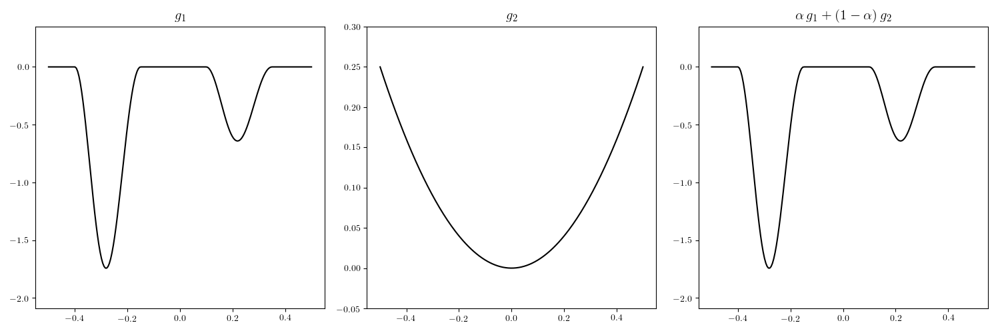
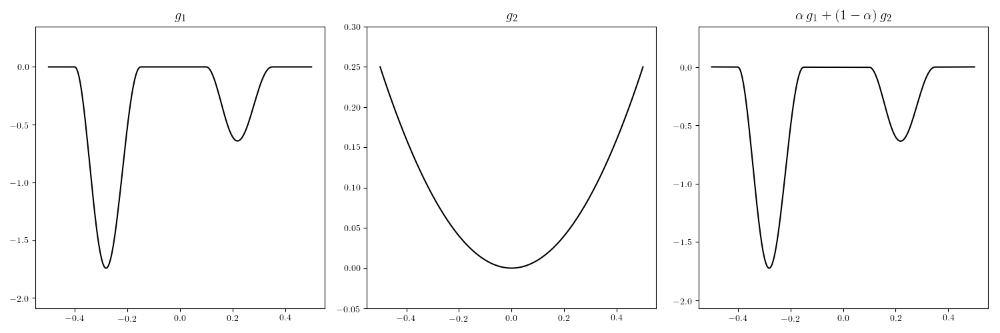
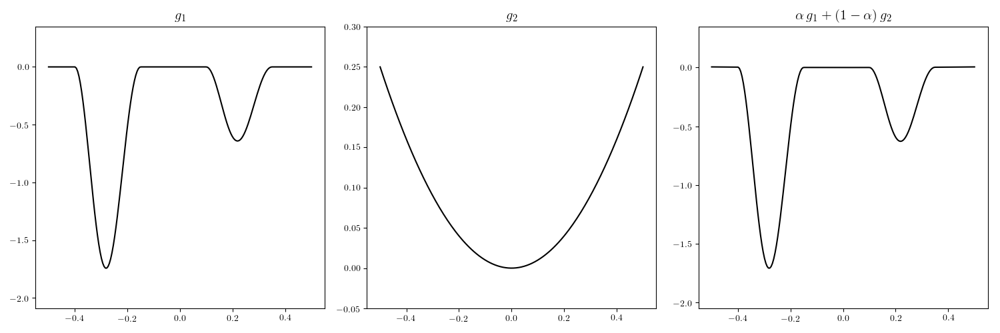
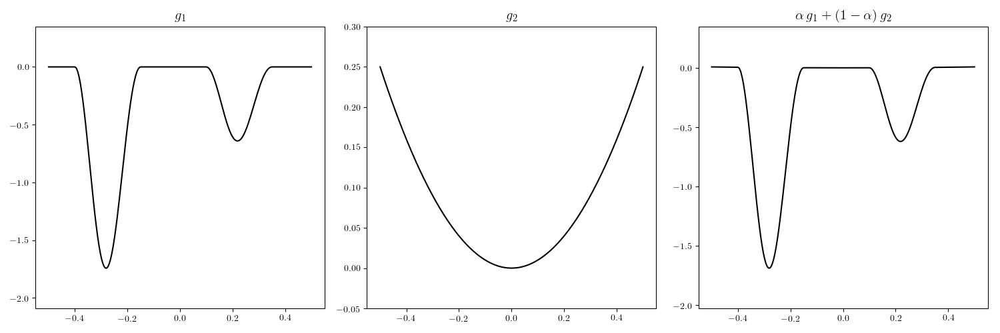
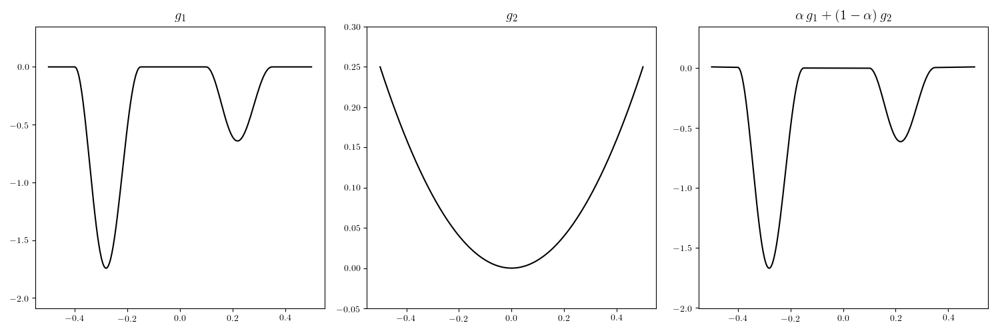
...
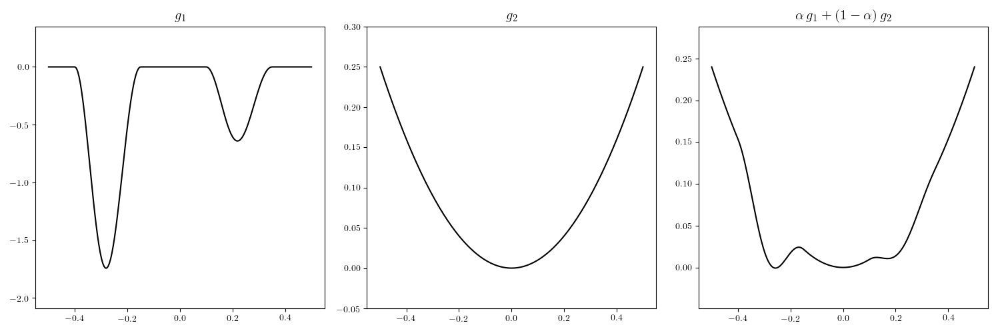
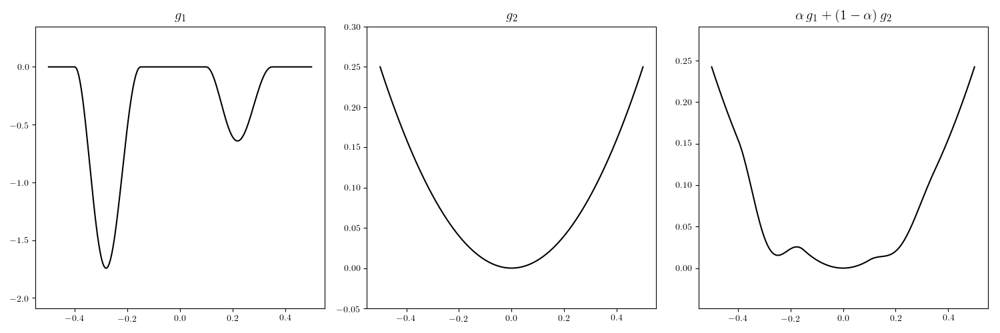
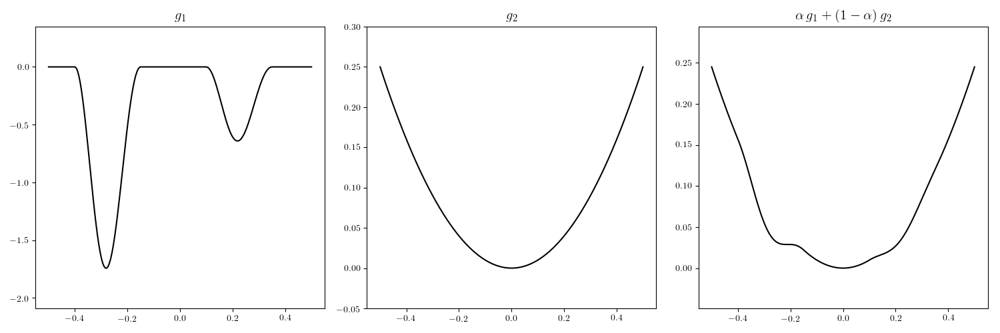
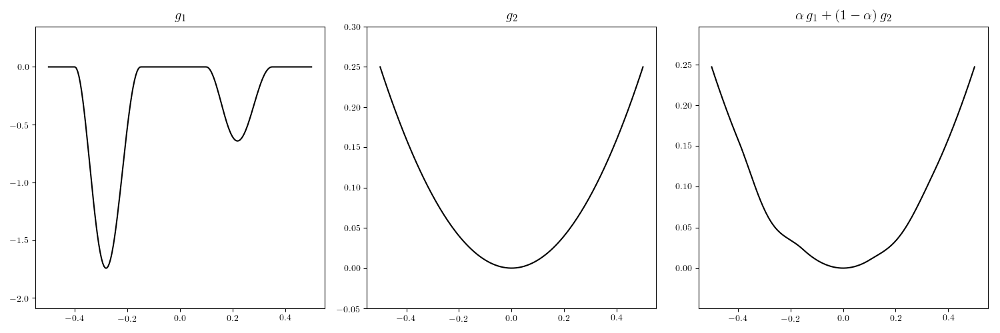
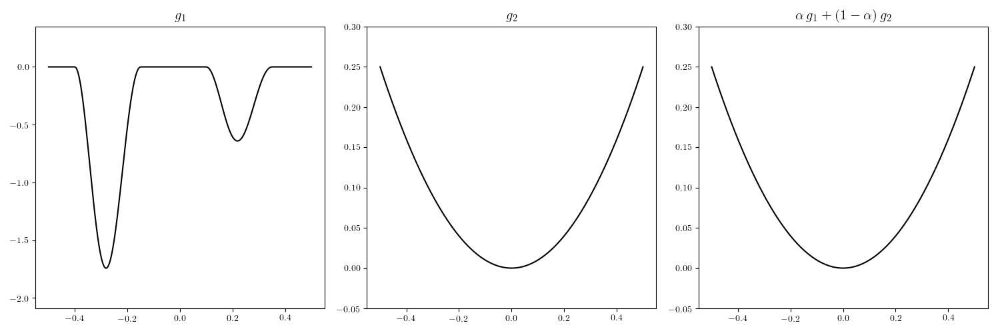

In [4]:
# what function should we play with?  Defined in the next line.
g1 = lambda w: -np.maximum(0,np.exp(-w)*np.sin(4*np.pi*(w - 0.1)))**2
g2 = lambda w: w**2

# create an instance of the visualizer with this function
test = basics_library.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = g1,g2 = g2,num_slides = 50,min_range = -0.5,max_range = 0.5)


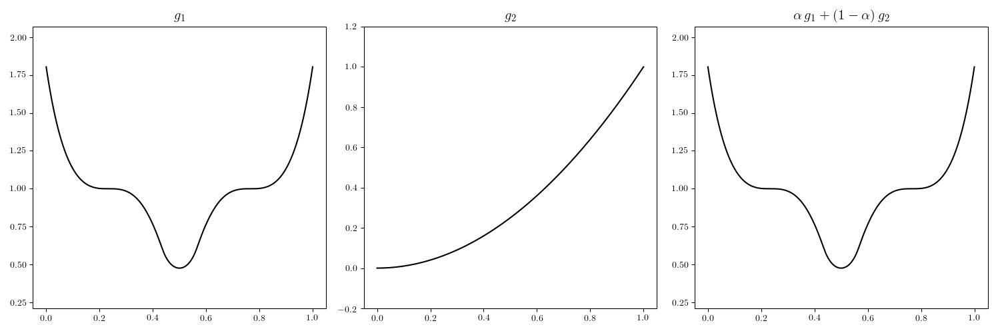
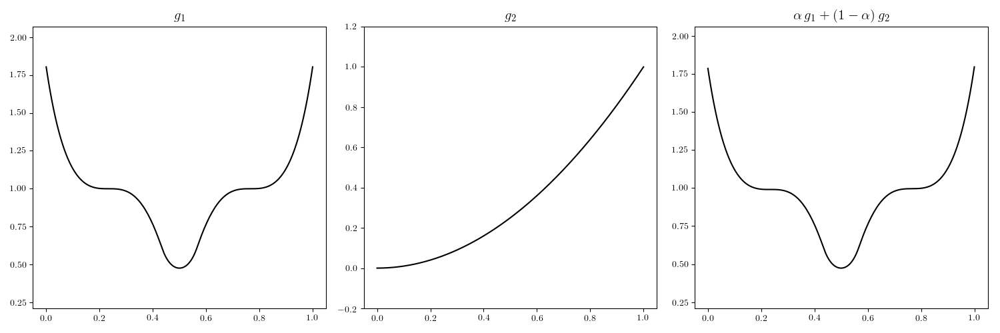
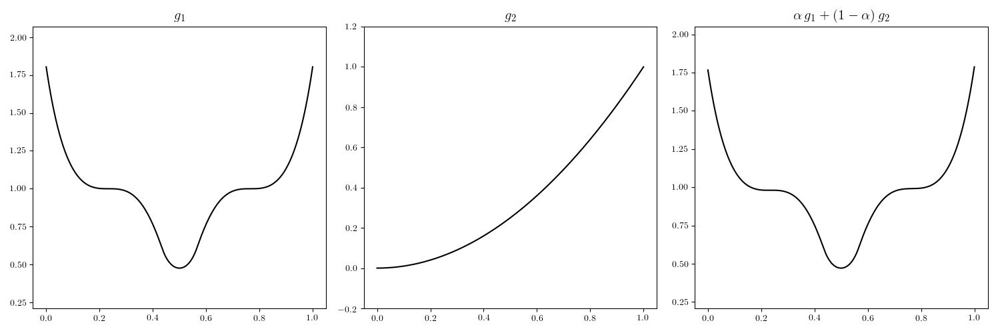
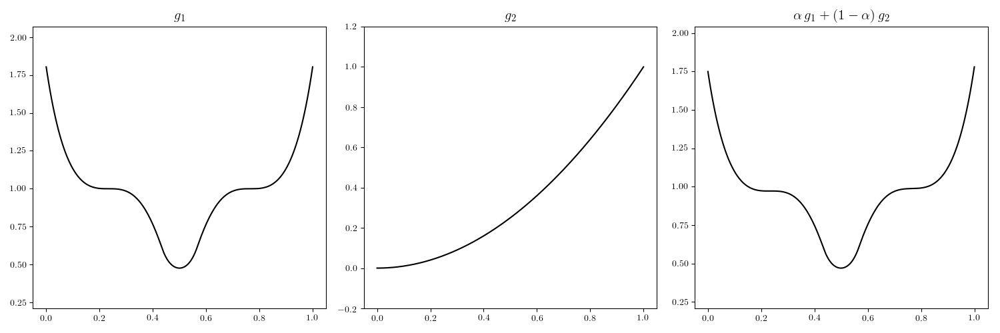
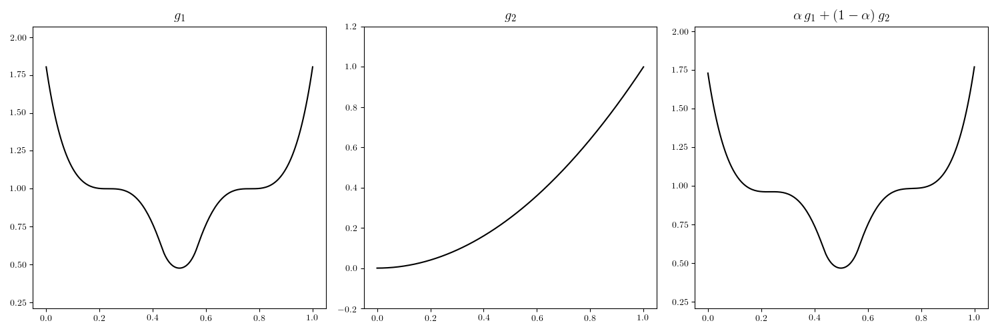
...
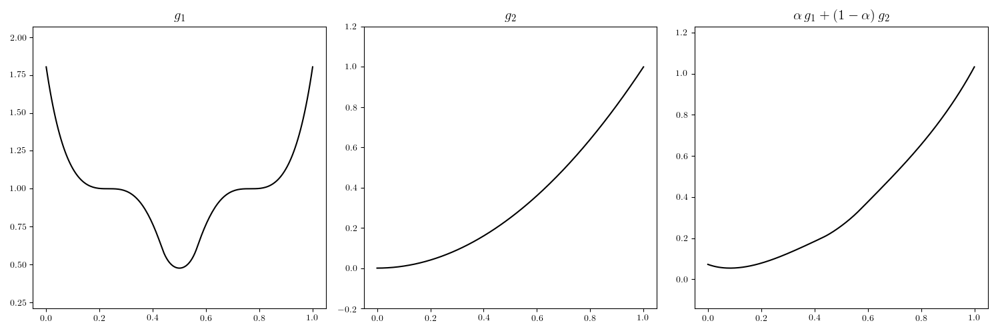
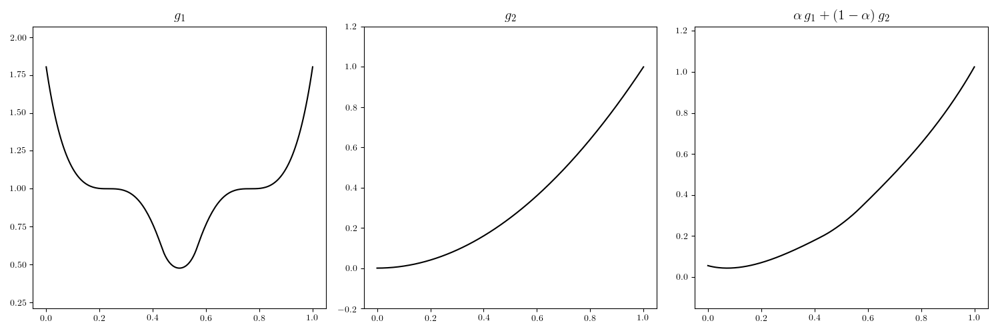
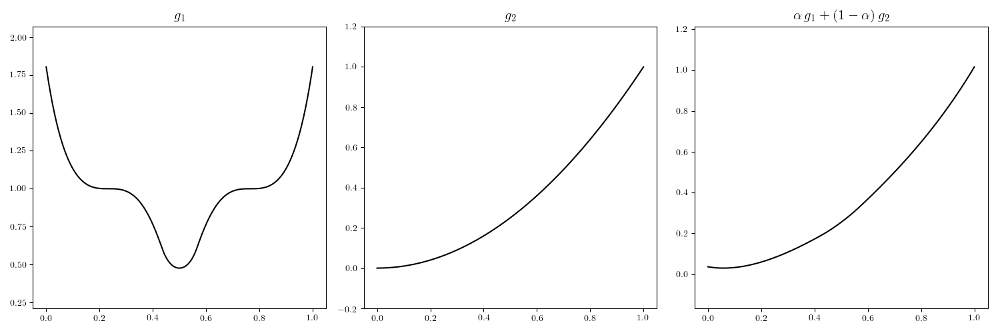
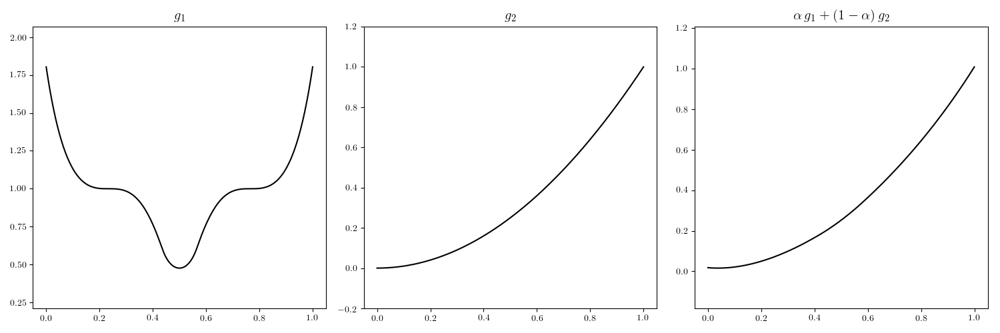
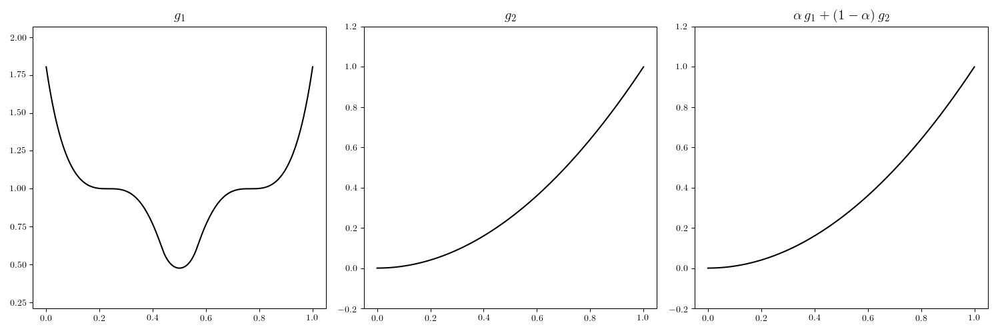

In [3]:
# what function should we play with?  Defined in the next line.
g1 = lambda w: np.maximum(0,(3*w - 2.3)**3 + 1)**2 + np.maximum(0, (-3*w + 0.7)**3 + 1)**2
g2 = lambda w: w**2

# create an instance of the visualizer with this function
test = basics_library.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = g1,g2 = g2,num_slides = 50,min_range = 0,max_range = 1)

# simple neural network example

In [23]:
# import custom JS animator
import sys
sys.path.append('../../')
from mlrefined_libraries.JSAnimation_slider_only import IPython_display

# import standard plotting and animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D

# import autograd functionality
from autograd import grad as compute_grad   # The only autograd function you may ever need
import autograd.numpy as np
from autograd import grad as compute_gradient
from autograd import hessian
import math

class visualizer:
    '''
    Convexifying a 3d non-convex surface with many saddle points.
    ''' 
    def __init__(self):
        # load in the bacterial dataset into self.x, self.y variables
        self.load_data()

        # compute gradient function of cost
        self.grad = compute_gradient(self.cost_function)
        
        # global regularization parameter
        self.lam = 0
        
    # load in data
    def load_data(self):
        # load data
        data = np.matrix(np.genfromtxt('../../mlrefined_datasets/superlearn_datasets/bacteria_data.csv', delimiter=','))
        self.x = np.asarray(data[:,0])
        self.y = np.asarray(data[:,1])
        
        
    ###### ML Algorithm functions ######
    # sigmoid function
    def sigmoid(self,val):
        t = 1/(1 + np.exp(-val))
        return t
    
    # our model
    def evaluate_model(self,w,x):
        model = self.sigmoid(w[0] + w[1]*x)
        return model

    # compute cost function value for given input weights
    def cost_function(self,w):
        cost = 0
        for p in range(len(self.y)):
            # get current datapoint
            x_p = self.x[p]
            y_p = self.y[p]

            # write out linear combination of data
            val = w[0] + w[1]*x_p

            # take nonlinearity - sigmoid - of input combination, compute
            # least squares against term against corresponding output, add 
            # weighted regularizer, and add result to running total of the cost function
            cost += (self.sigmoid(val) - y_p)**2 + self.lam*(w[0]**2 + w[1]**2)
        return cost

    # run gradient descent
    def gradient_descent(self,w,alpha,max_its):
        # initiate container for weight history, store initial value
        w_hist = [w]
        
        # start gradient descent loop - with max_its stopping condition
        for k in range(max_its):
            # take gradient descent step
            w = w - alpha*self.grad(w)
            
            # store new weights in history
            w_hist.append(w)
            
        return w_hist

    # run the whole sha-bang
    def run_example(self,w_init_1,w_init_2,**args):
        w_init_1 = np.asarray([float(v) for v in w_init_1])
        w_init_2 = np.asarray([float(v) for v in w_init_2])
        
        # choose a range of lambdas to visualize
        lam_range = np.linspace(0,10**-2,10)
        if 'lam_range' in args:
            lam_range = args['lam_range']
            
        # choose a step length and max iterations for runs of gradient descent
        alpha = 10**-2
        if 'alpha' in args:
            alpha = args['alpha']
        
        max_its = 2000
        if 'max_its' in args:
            max_its = args['max_its']
            
        # initiate figure
        fig = plt.figure(figsize = (8,4))
        artist = fig
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122, projection='3d')
            
        # main animation function
        def animate(k):
            # clear current plots for next frame of animation
            ax1.cla()
            ax2.cla()
            
            # choose current regularization parameter
            self.lam = lam_range[k]
            
            # run gradient descent with two user-chosen initial values and chosen regularization value
            w_hist_1 = self.gradient_descent(w = w_init_1, alpha = alpha, max_its = max_its)
            w_hist_2 = self.gradient_descent(w = w_init_2, alpha = alpha, max_its = max_its)
            
            # plot data points in panel 1, and cost function in panel 2
            self.show_data_and_fit(ax1,w_hist_1[-1],color = 'lime')
            self.show_data_and_fit(ax1,w_hist_2[-1],color = 'magenta')

            # plot logistic surface, as well as gradient descent paths, in panel 2
            self.plot_logistic_surface(ax2)
            self.show_descent_path(ax2,w_hist_1,color = 'lime')
            self.show_descent_path(ax2,w_hist_2,color = 'magenta')

            return artist,

        anim = animation.FuncAnimation(fig, animate ,frames=len(lam_range), interval=len(lam_range), blit=True)
        
        return(anim)
    
    ####### plotting functions #######
    # show data and cost function fit to the data in panel 1
    def show_data_and_fit(self,ax,w,color):
        # plot data
        ax.scatter(self.x,self.y,s = 40, color = 'k',edgecolor = 'w',linewidth = 1)
                
        # show fit to data
        s = np.linspace(self.x.min(),self.x.max(),100)
        t = self.evaluate_model(w,s)
        ax.plot(s,t,color = color)
        
        # clean up plot
        ax.set_xlabel('$x$',fontsize=20,labelpad = 10)
        ax.set_ylabel('$y$',fontsize=20,rotation = 0,labelpad = 10)
        ax.set_xlim(min(self.x[:,0])-0.5, max(self.x[:,0])+0.5)
        ax.set_ylim(min(self.y)-0.1,max(self.y)+0.1)
        
    # make 3d surface plot
    def plot_logistic_surface(self,ax):
        # make a meshgrid of weights for the 3d surface
        r = np.linspace(-3,3,100)
        s,t = np.meshgrid(r, r)
        s = np.reshape(s,(np.size(s),1))
        t = np.reshape(t,(np.size(t),1))
        weights = np.concatenate((s,t),1)

        # build 3d surface - weight by weight
        cost_surface = []
        for i in range(len(weights)):
            w = weights[i]
            cost_surface.append(self.cost_function(w))
        cost_surface = np.asarray(cost_surface)
        
        # reshape everything for plotting
        s.shape = (len(r),len(r))
        t.shape =  (len(r),len(r))
        cost_surface.shape = (len(r),len(r))

        # plot 3d surface
        ax.plot_surface(s,t,cost_surface,cmap = 'jet',rstride=15, cstride=15,linewidth=1,edgecolor = 'k')
        
        # clean up plot and set viewing angle
        ax.xaxis.set_rotate_label(False)
        ax.yaxis.set_rotate_label(False)
        ax.zaxis.set_rotate_label(False)
        ax.get_xaxis().set_ticks([-3,-1,1,3])
        ax.get_yaxis().set_ticks([-3,-1,1,3])
        ax.set_xlabel('$w_0$   ',fontsize=20,rotation = 0,linespacing = 10)
        ax.set_ylabel('$w_1$',fontsize=20,rotation = 0,labelpad = 10)
        ax.set_zlabel('   $g(\mathbf{w})$',fontsize=20,rotation = 0,labelpad = 10)
        ax.azim = 175
        ax.elev = 10
        plt.show()
        
    # show descent paths on the cost surface in panel 2
    def show_descent_path(self,ax,w_hist,color):
        # compute cost path using input weight history
        cost_path = []
        for i in range(len(w_hist)):
            w = w_hist[i]
            cost = self.cost_function(w)
            cost += 10**-3                          # add a little to the height of the cost path so its visible on top of the surface plot
            cost_path.append(cost)
        
        # plot grad descent path onto surface
        w0 = [v[0] for v in w_hist]
        w1 = [v[1] for v in w_hist]
        cost_path = [v[0] for v in cost_path]
        ax.plot(w0,w1,cost_path,color = color,linewidth = 5)  

<IPython.core.display.Javascript object>


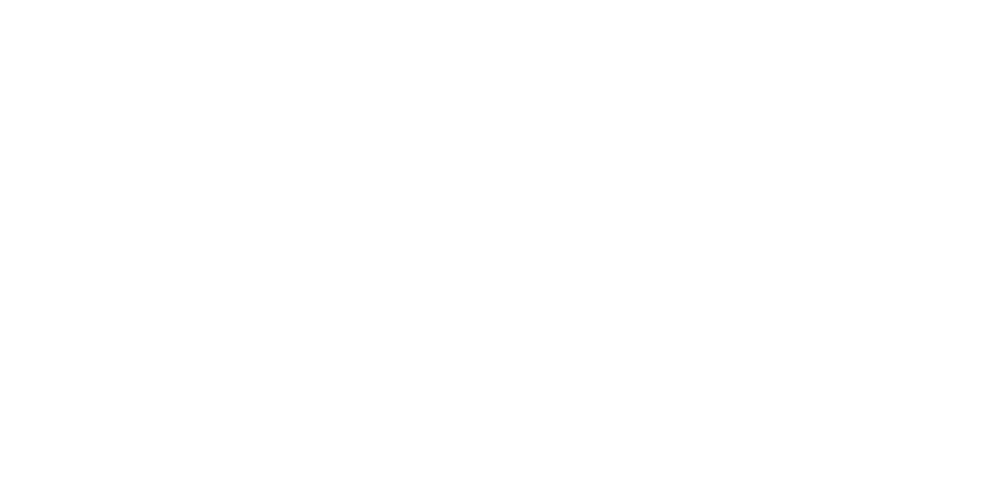


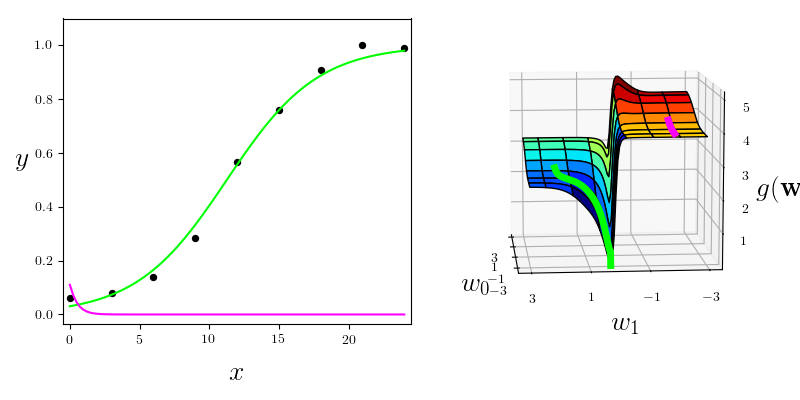
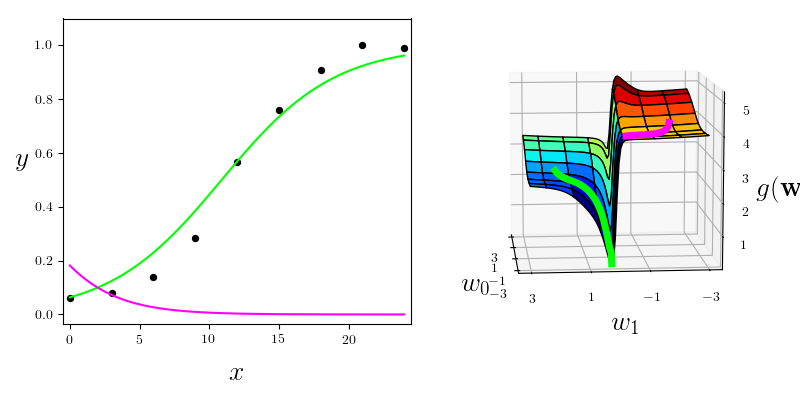
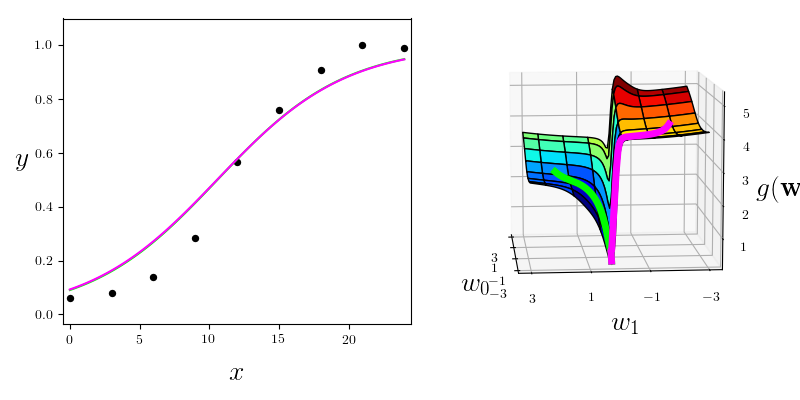
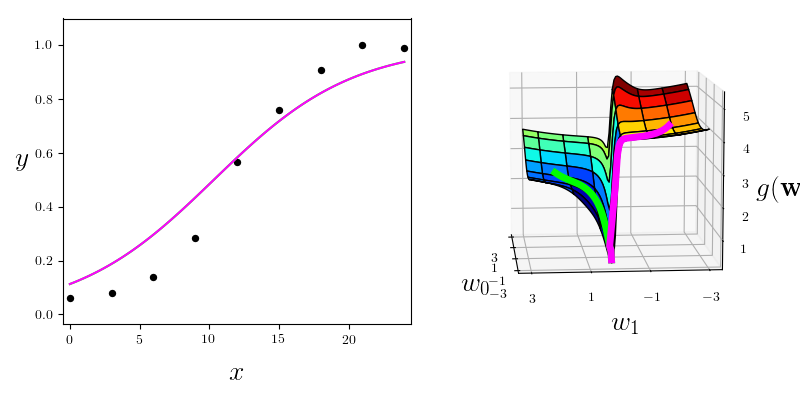
...
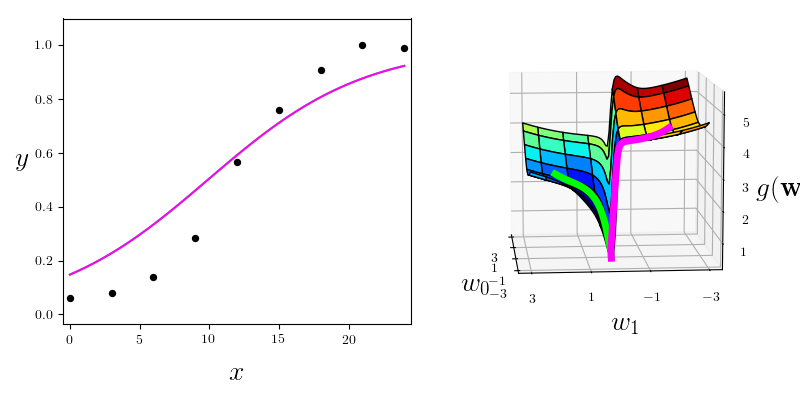
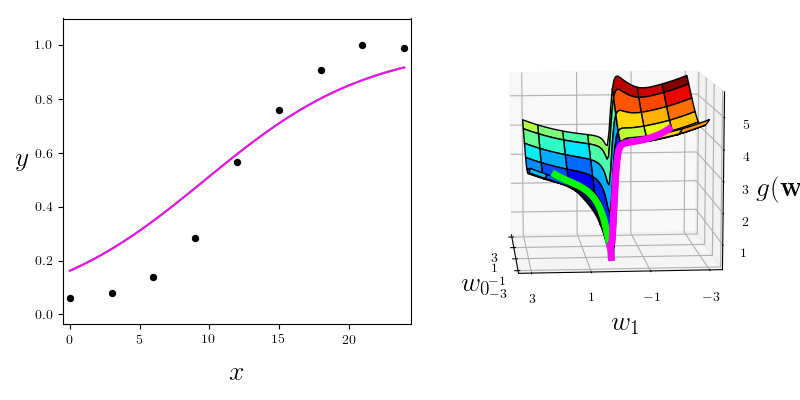
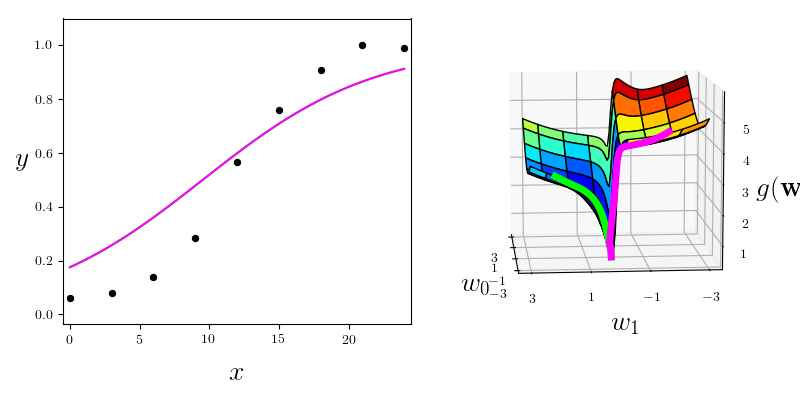
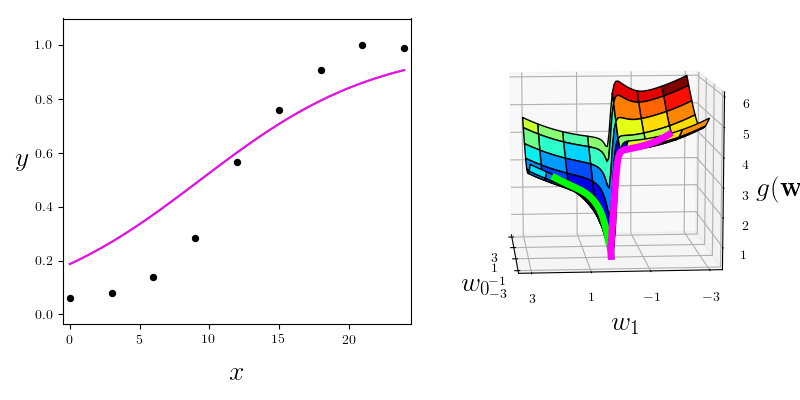
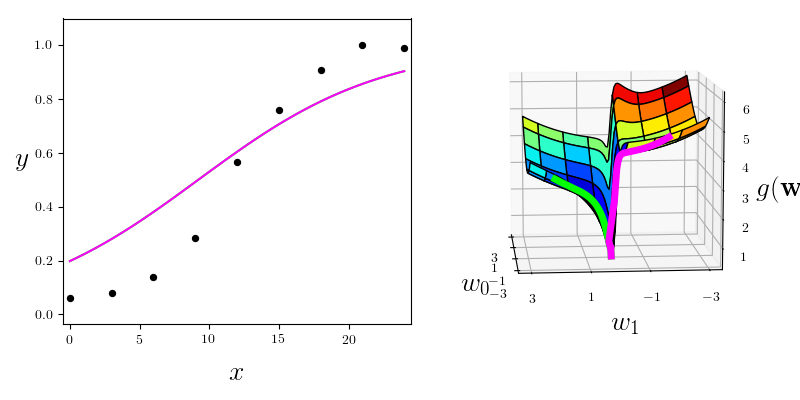

In [25]:
test = visualizer()

w_init_1 = [0,2]
w_init_2 = [0,-2]
lam_range = 0
max_its = 5000
test.run_example(w_init_1 = w_init_1, w_init_2 = w_init_2,max_its = max_its)
